In [1]:
import os
import pprint
import fitz
from tqdm import tqdm
from audiobook import setup_tts, describe_image, chunk_text, concatenate_audio_pydub, make_page_reading, Doc, load_chapters_from_yaml
from IPython.display import Image, Audio

In [4]:
chapters = load_chapters_from_yaml('chapters.yaml')
print(chapters)

[Chapter(chapter_number=1, chapter_title_header='THE GOLEM OF PRAGUE', chapter_title_footer='', chapter_start_page=13, chapter_end_page=30)]


In [7]:
tts = setup_tts()
AUDIO_RATE = 24000

 > tts_models/multilingual/multi-dataset/xtts_v2 is already downloaded.
 > Using model: xtts


In [ ]:
example_tts = tts.tts(text="Fruits and vegetables keep me alive.",
        speaker_wav="speaker-longer-enhanced-90p.wav",
        language="en")

 > Text splitted to sentences.
['Fruits and vegetables keep me alive.']
 > Processing time: 4.532238960266113
 > Real-time factor: 1.8322064585264703


In [12]:
Audio(example_tts, rate=AUDIO_RATE)

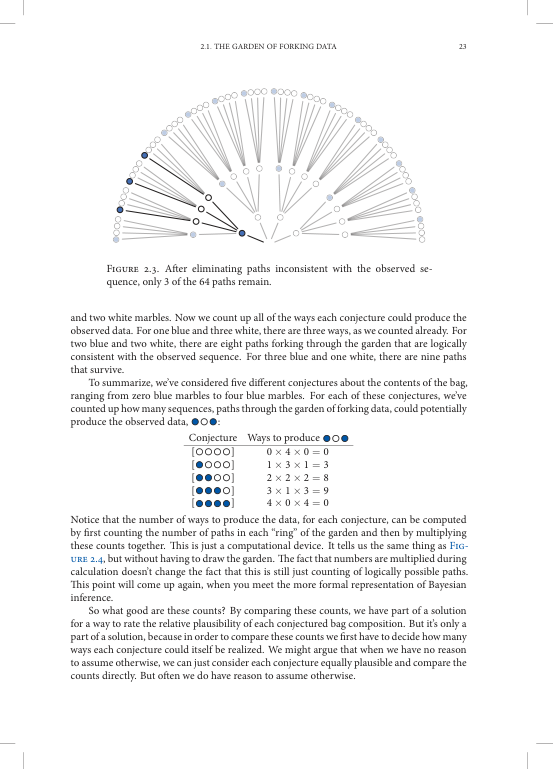

In [5]:
path = "../RM-StatRethink-Bayes.pdf"
doc = fitz.open(path)
pg_36 = doc[36]
page = pg_36.get_pixmap().save("page.png")
Image("page.png")

In [8]:
working_doc = Doc(pages=[], figures=[])
test_page = 49 + 14
saved_location = make_page_reading(working_doc, tts, doc[test_page], test_page)
Audio(saved_location, rate=AUDIO_RATE)

In [3]:
response

'The image is a diagram depicting what is referred to as "the garden of forking data." At the top of the image, there is a sequence of marble like symbols, starting with a blue circle followed by three white circles, representing a sequence of colored marbles. Below this sequence, there is a branching structure resembling a pruned tree or a network of pathways, which appears to simulate different paths that the sequence of marbles could have taken when being drawn from a bag in various conjectured contents of the bag.\n\nEach path starts from the bottom and forks multiple times as it reaches upwards. The number of forking paths reduces as they are filtered to match the observed sequence of marble colors. Only 3 of the 64 paths that the diagram initially suggests survive the logical consistency check with the observed draw sequence of marbles.\n\nBelow the branching diagram, there is a table with the heading "Conjecture" which has rows each with a set of four marble symbols in different

In [ ]:
# Example usage
text = "Your long text here"
chunks, figures = chunk_text(text, 200, "page.png")
for chunk in chunks:
    print(chunk)

print(figures)

Your long text here
set()


In [ ]:
test_text, test_figure = chunk_text(pg_36.get_text(), 200, page_image="page.png", handle_figures=True)

In [ ]:
test_text

['2.1. THE GARDEN OF FORKING DATA 23 Figure 2.3',
 'Description of 2.3 : The image you shared is titled Figure 2.3 and contains a diagram of the "Garden of Forking Data" as referenced in the surrounding text. The diagram depicts a branching structure',
 'that starts at a single point and then diverges into multiple paths, reminiscent of the layout of a garden with various forking paths. At the top of the diagram, there are a series of circles',
 'representing marbles: two blue and three white in a particular sequence. Below the diagram, there is a table that lists five different conjectures about the contents of a bag, specified by the number',
 'of blue and white marbles. Next to each conjecture is the "Ways to produce" the sequence of blue and white marbles as observed, resulting in a specific number of paths that align with each conjecture.',
 'The passage describes how, after accounting for paths that are inconsistent with the observed sequence of marbles, there are only 3 out of t

In [ ]:
test_text_joined = ' '.join(test_text)
cleaned_text = describe_image("page.png", "", test_text_joined, mode="general_cleanup")

In [ ]:
test_text_joined

'2.1. THE GARDEN OF FORKING DATA 23 Figure 2.3 Description of 2.3 : The image you shared is titled Figure 2.3 and contains a diagram of the "Garden of Forking Data" as referenced in the surrounding text. The diagram depicts a branching structure that starts at a single point and then diverges into multiple paths, reminiscent of the layout of a garden with various forking paths. At the top of the diagram, there are a series of circles representing marbles: two blue and three white in a particular sequence. Below the diagram, there is a table that lists five different conjectures about the contents of a bag, specified by the number of blue and white marbles. Next to each conjecture is the "Ways to produce" the sequence of blue and white marbles as observed, resulting in a specific number of paths that align with each conjecture. The passage describes how, after accounting for paths that are inconsistent with the observed sequence of marbles, there are only 3 out of the 64 paths that rema

In [ ]:
print(cleaned_text)

2.1. THE GARDEN OF FORKING DATA

Figure 2.3. After eliminating paths inconsistent with the observed sequence, only 3 of the 64 paths remain.

The image you shared is titled Figure 2.3 and contains a diagram of the "Garden of Forking Data" as referenced in the surrounding text. The diagram depicts a branching structure that starts at a single point and then diverges into multiple paths, reminiscent of the layout of a garden with various forking paths. At the top of the diagram, there are a series of circles representing marbles: two blue and three white in a particular sequence. Below the diagram, there is a table that lists five different conjectures about the contents of a bag, specified by the number of blue and white marbles. Next to each conjecture is the "Ways to produce" the sequence of blue and white marbles as observed, resulting in a specific number of paths that align with each conjecture.

The passage continues: 

Now we count up all the ways each conjecture could produce th

In [ ]:
# len(doc)
doc = fitz.open('mount/book.pdf')


NameError: name 'fitz' is not defined

In [ ]:
def make_transcriptions(path, tts, page_start=0, page_end=1):
    doc = fitz.open(path)
    for index, page in enumerate(doc[page_start:page_end]):
        audio_path = "outputs/pages/{0}".format(index)
        page_path = "outputs/pages/{0}/page.png".format(index)
        if not os.path.exists(audio_path):
            os.makedirs(audio_path)
        page_image = page.get_pixmap().save(page_path)
        initial_text, _figure = chunk_text(page.get_text(), 200, page_image=page_path, handle_figures=True)
        initial_text_joined = ' '.join(initial_text)
        cleaned_text = describe_image(page_path, "", initial_text_joined, mode="general_cleanup")
        final_text_to_write, _figure = chunk_text(cleaned_text, 200, page_image=page_path, handle_figures=False)
        for index, text_chunk in tqdm(enumerate(final_text_to_write)):
            tts.tts_to_file(text=text_chunk,
                            file_path=audio_path + "/{0}.wav".format(index),
                            speaker_wav="speaker-longer-enhanced-90p.wav",
                            language="en")
        concatenate_audio_pydub(audio_path, "combined.wav")

In [ ]:
# this equals about 24 hours in CPU time, which isn't terrible I guess.
#Should look into huggingface native for actual GPU support.

In [ ]:
# Example usage
concatenate_audio_pydub("outputs/pages/36/", "combined_audio.wav")

Reading audio files: 100%|██████████| 18/18 [00:00<00:00, 1988.35it/s]
